In [1]:
# Camera Calibration

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')


ny = 6
nx = 9
        
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        write_name = 'output_images/draw_corners/'+fname.split('/')[-1]
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)


cv2.destroyAllWindows()


In [2]:
# Distortion correction

import pickle
%matplotlib inline

def undistort(img):
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [3]:
# # Test undistortion on an image
# test_images = glob.glob('test_images/*.jpg')
# # test_images = glob.glob('camera_cal/*.jpg')


# for idx, fname in enumerate(test_images):
#     test_img = cv2.imread(fname)
#     # change to RGB color
#     test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    
#     undistorted = undistort(test_img)
#     undistorted_save = cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB)
# #     undistorted_save = cv2.cvtColor(undistorted, cv2.COLOR_RGB2BGR)

#     write_name = 'output_images/undistorted/camera/' + fname.split('/')[-1]
#     print(write_name)
#     cv2.imwrite(write_name, undistorted_save)
    
#     # Visualize undistortion
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#     ax1.imshow(test_img)
#     ax1.set_title('Original Image', fontsize=30)
#     ax2.imshow(undistorted)
#     ax2.set_title('Undistorted Image', fontsize=30)


# cv2.destroyAllWindows()

In [4]:
# Color/gradient threshold

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


def color_binary(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = 255*np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)).astype('uint8') 
    return color_binary

In [5]:
# undistorted = glob.glob('output_images/undistorted/*.jpg')


# for idx, fname in enumerate(undistorted):
#     undistorted_img = cv2.imread(fname)
#     result = color_binary(undistorted_img)
    
#     write_name = 'output_images/threshold/' + fname.split('/')[-1]
#     print(write_name)
#     cv2.imwrite(write_name, result)

#     # Plot the result
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     f.tight_layout()

#     ax1.imshow(undistorted_img)
#     ax1.set_title('Original Image', fontsize=40)

#     ax2.imshow(result)
#     ax2.set_title('Color_binary Result', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
# cv2.destroyAllWindows()

In [6]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def warp(img):

    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    
    corners = np.float32([[0+150,720],[640-50,450],[640+50,450],[1280-150,720]])
    new_top_left=np.array([corners[0,0],0])
    new_top_right=np.array([corners[3,0],0])
    offset=[150,0]
    
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([corners[0]+offset, new_top_left+offset, new_top_right-offset, corners[3]-offset])    
    # Given src and dst points, calculate the perspective transform matrix
    
    M = cv2.getPerspectiveTransform(dst,src)
        
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    # Return the resulting image and matrix
    return warped, M

In [7]:
# threshold_images = glob.glob('output_images/threshold/*.jpg')

# for idx, fname in enumerate(threshold_images):
#     threshold_img = cv2.imread(fname)
#     warped, _ = warp(threshold_img)
    
#     write_name = 'output_images/warped/' + fname.split('/')[-1]
#     print(write_name)
#     cv2.imwrite(write_name, warped)

#     # Plot the result
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     f.tight_layout()

#     ax1.imshow(threshold_img)
#     ax1.set_title('Original Image', fontsize=40)

#     ax2.imshow(warped)
#     ax2.set_title('Warped Image', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
# cv2.destroyAllWindows()

In [8]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt



def region_of_interest(img): #code from Project1
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)  
    
    shape = img.shape
    #vertices = np.array([[(0,0),(shape[1],0),(shape[1],0),(6*shape[1]/7,shape[0]),
                      #(shape[1]/7,shape[0]), (0,0)]],dtype=np.int32)
    vertices = np.array([[(0,0),(shape[1],0),(shape[1],0),(5*shape[1]/6,shape[0]),
                      (shape[1]/6,shape[0])]],dtype=np.int32)
    
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def pipeline(img):
    undistorted = undistort(img)  
    binary = color_binary(undistorted)
    warped, Minv = warp(binary)
    result = region_of_interest(warped)
    return result

In [9]:
# %matplotlib inline
# test_images = glob.glob('test_images/*.jpg')

# for idx, fname in enumerate(test_images):
#     test_img = cv2.imread(fname)
#     test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
#     img = pipeline(test_img)
    
#     write_name = 'output_images/stage1/' + fname.split('/')[-1]
#     print(write_name, img.shape)
#     cv2.imwrite(write_name, img)


#     # Plot the result
#     f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     f.tight_layout()

#     ax1.imshow(test_img)
#     ax1.set_title('Original Image', fontsize=40)

#     ax2.imshow(img)
#     ax2.set_title('Warped binary ROI', fontsize=40)

In [10]:
# code from Lesson16 chapter33 "Finding the Lines"
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline



binary_warped = cv2.imread("output_images/stage1/straight_lines1.jpg")
binary_warped = cv2.cvtColor(binary_warped, cv2.COLOR_BGR2GRAY)

def finding_lines(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 5
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
#     # Generate x and y values for plotting
#     ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#     nonzero = binary_warped.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])

#     out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
#     out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
#     plt.imshow(out_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)
    
    return left_fit, right_fit
    
left_fit, right_fit = finding_lines(binary_warped)

In [11]:
# code from Lesson16 chapter33 "Finding the Lines"
import numpy as np
import cv2
import matplotlib.pyplot as plt

def update_finding_lines(binary_warped, left_fit, right_fit):
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit
    
#     # Generate x and y values for plotting
#     ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

#     # Create an image to draw on and an image to show the selection window
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#     window_img = np.zeros_like(out_img)
#     # Color in left and right line pixels
#     out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
#     out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

#     # Generate a polygon to illustrate the search window area
#     # And recast the x and y points into usable format for cv2.fillPoly()
#     left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
#     left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
#     left_line_pts = np.hstack((left_line_window1, left_line_window2))
#     right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
#     right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
#     right_line_pts = np.hstack((right_line_window1, right_line_window2))

#     # Draw the lane onto the warped blank image
#     cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
#     cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
#     result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
#     plt.imshow(result)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)

    
    
update_finding_lines(binary_warped, left_fit, right_fit)

(array([  4.83541220e-05,  -2.72228887e-02,   3.45110749e+02]),
 array([ -8.53096448e-05,   8.19842733e-02,   9.38335690e+02]))

In [12]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# import glob
# import cv2


# # Read in a thresholded image
# warped = mpimg.imread('output_images/stage1/straight_lines1.jpg')
# warped = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)

# # window settings
# window_width = 50 
# window_height = 80 # Break image into 9 vertical layers since image height is 720
# margin = 100 # How much to slide left and right for searching

# def window_mask(width, height, img_ref, center,level):
#     output = np.zeros_like(img_ref)
#     output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
#     return output

# def find_window_centroids(image, window_width, window_height, margin):
    
#     window_centroids = [] # Store the (left,right) window centroid positions per level
#     window = np.ones(window_width) # Create our window template that we will use for convolutions
    
#     # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
#     # and then np.convolve the vertical image slice with the window template 
    
#     # Sum quarter bottom of image to get slice, could use a different ratio
#     l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
#     l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
#     r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
#     r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
#     # Add what we found for the first layer
#     window_centroids.append((l_center,r_center))
    
#     # Go through each layer looking for max pixel locations
#     for level in range(1,(int)(warped.shape[0]/window_height)):
#         # convolve the window into the vertical slice of the image
#         image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
#         conv_signal = np.convolve(window, image_layer)
#         # Find the best left centroid by using past left center as a reference
#         # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
#         offset = window_width/2
#         l_min_index = int(max(l_center+offset-margin,0))
#         l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
#         l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
#         # Find the best right centroid by using past right center as a reference
#         r_min_index = int(max(r_center+offset-margin,0))
#         r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
#         r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
#         # Add what we found for that layer
#         window_centroids.append((l_center,r_center))

#     return window_centroids


# def draw_window_fitting(warped, window_width, window_height, margin):
    
#     window_centroids = find_window_centroids(warped, window_width, window_height, margin)
#     # If we found any window centers
#     if len(window_centroids) > 0:

#         # Points used to draw all the left and right windows
#         l_points = np.zeros_like(warped)
#         r_points = np.zeros_like(warped)

#         # Go through each level and draw the windows 	
#         for level in range(0,len(window_centroids)):
#             # Window_mask is a function to draw window areas
#             l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
#             r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
#             # Add graphic points from window mask here to total pixels found 
#             l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
#             r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

#         # Draw the results
#         template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
#         zero_channel = np.zeros_like(template) # create a zero color channle 
#         template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
#         warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
#         output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

#     # If no window centers found, just display orginal road image
#     else:
#         output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
        
#     return output, l_points, r_points

# output,l,r = draw_window_fitting(warped, window_width, window_height, margin)

# # Display the final results
# plt.imshow(output)
# plt.title('window fitting results')
# plt.show()

In [13]:
# Define a class to receive the characteristics of each line detection
from collections import deque


class Line():
    def __init__(self, n=9):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        # use a deque to store all recent xfitted values
        self.recent_xfitted = deque([],maxlen=n)
        #average x values of the fitted line over the last n iterations
        self.bestx = None    
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        #polynomial coefficients for the last fit
        self.last_fit = [np.array([False])]  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #x values of the most recent fitted line
        self.current_fitx = [np.array([False])] 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #y values for line fit, cover same y-range as image
        self.ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] ) 
    
    #x values of the most recent fitted line
    def set_current_fitx(self):
        self.current_fitx = self.current_fit[0]*self.ploty**2 + self.current_fit[1]*self.ploty + self.current_fit[2]

    def push(self):
        self.recent_xfitted.appendleft(self.current_fitx)
        self.last_fit = self.current_fit # assign latest fit to last fit

    def pop(self):
        self.recent_xfitted.pop()

    #average x values of the fitted line over the last n iterations
    def set_bestx(self):
        if len(self.recent_xfitted)>1:
            n = 0
            total = 0
            for fit in self.recent_xfitted:
                n = n+1
                total +=np.array(fit)
            self.bestx = total / n
        else:
            self.bestx = self.current_fitx

    def get_diffs(self):
        if len(self.recent_xfitted)>3:
            self.diffs = self.current_fit - self.last_fit
        else:
            self.diffs = np.array([0,0,0], dtype='float')  

    def sanity_check(self):     
        if (len(self.recent_xfitted)>=3) and (abs(self.current_fit[0])>= 1e-5):
            # if difference is greater than 500% 500% 500% for current_fit coeffecient
            if (abs(self.diffs / self.current_fit) > np.array([5,5,5])).any():  
                self.detected=False
                print("line is not valid! reset line")
                self.recent_xfitted.clear()
            else:
                self.detected=True
        else:
            self.detected=True

    def set_radius_of_curvature(self):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        # Define y-value where we want radius of curvature (choose bottom of the image)
        y_eval = np.max(self.ploty)
        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(self.ploty*ym_per_pix, self.current_fitx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        self.radius_of_curvature = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])


    def set_line_base_pos(self):
        # Define conversions in x and y from pixels space to meters
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(self.ploty)
        self.line_pos = self.current_fit[0]*y_eval**2 + self.current_fit[1]*y_eval + self.current_fit[2]
        basepos = 640 # bottom center 
        self.line_base_pos = (self.line_pos - basepos)*xm_per_pix  # meters per pixel in x dimension

    def calculate(self):
        self.set_current_fitx()
        self.get_diffs()
        self.sanity_check()
        
        self.push()
        self.set_bestx()
        self.set_radius_of_curvature()
        self.set_line_base_pos()



In [14]:
def drawing(image,left_fitx,right_fitx):
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    undist = undistort(image)    
    unwarp, Minv = warp(image)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

In [17]:
#initial left and right class to store all information


def process_image(image):
    
    # Get the binary warped image
    binary_warped = pipeline(image)
    binary_warped = cv2.cvtColor(binary_warped, cv2.COLOR_BGR2GRAY)
    
    # Get polynomial coefficients for the most recent fit from the binary warped image
    if (left.detected == False) or (right.detected == False):
        left.current_fit, right.current_fit = finding_lines(binary_warped)
    else:
        left.current_fit, right.current_fit = update_finding_lines(binary_warped,left.current_fit,right.current_fit)
    
    # Calculate Line Information
    left.calculate()
    right.calculate()
  
    result = drawing(image,left.bestx,right.bestx)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    if (left.detected == False) or (right.detected == False):
        str1 = str('Line is not detected!')
        cv2.putText(result,str1,(100,100), font, 1,(255,0,0),2,cv2.LINE_AA)
    else:
        off_center = round((left.line_base_pos + right.line_base_pos)/2,4) * 100 # change to cm
        if abs(off_center)> 60:
            str1 = str('Line is not detected!')
            cv2.putText(result,str1,(100,100), font, 1,(255,0,0),2,cv2.LINE_AA)
            left.detected == False
            right.detected == False
        else:
            str1 = str(off_center)+ ' cm off from center'
            cv2.putText(result,str1,(100,100), font, 1,(255,255,255),2,cv2.LINE_AA)
            str2 = str(round(min(left.radius_of_curvature, right.radius_of_curvature),2))+ ' m radius of curvature'
            cv2.putText(result,str2,(100,150), font, 1,(255,255,255),2,cv2.LINE_AA)
        
    return result

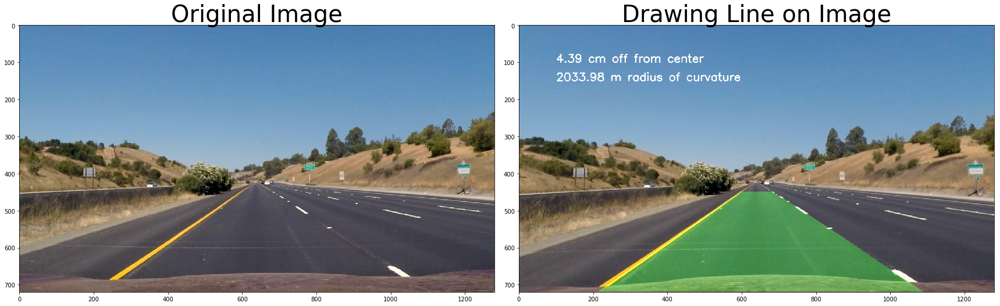

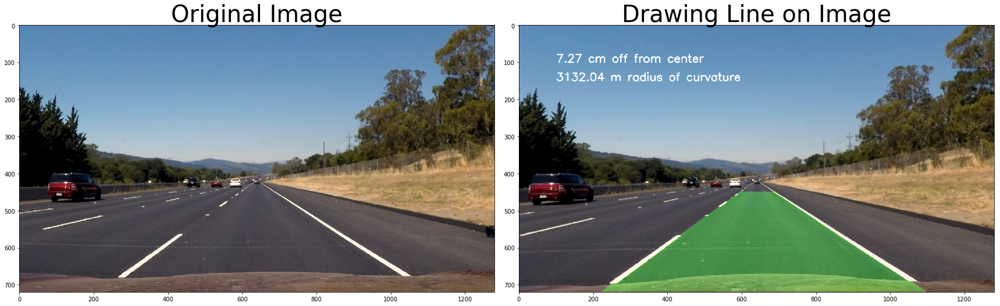

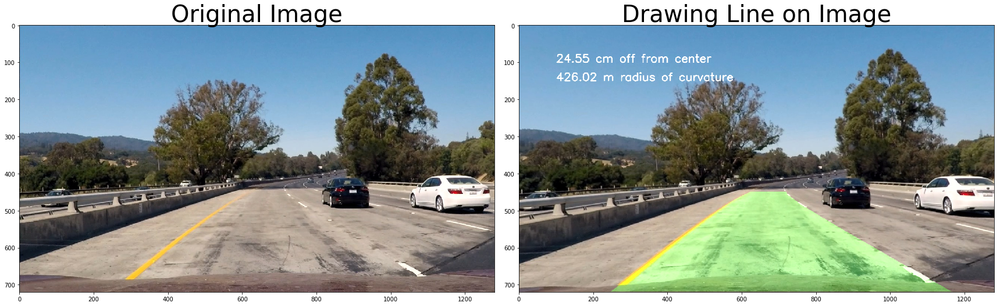

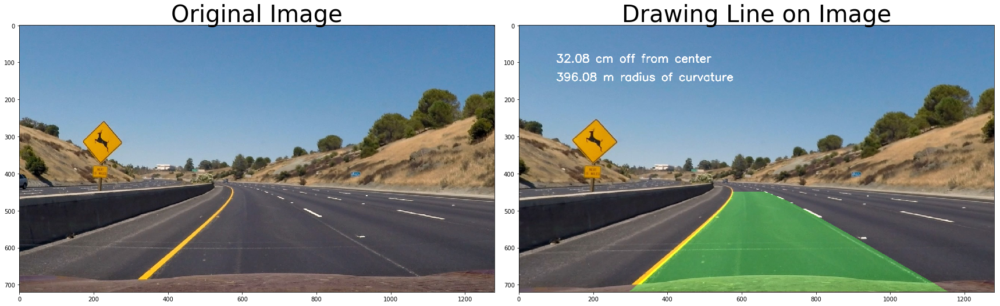

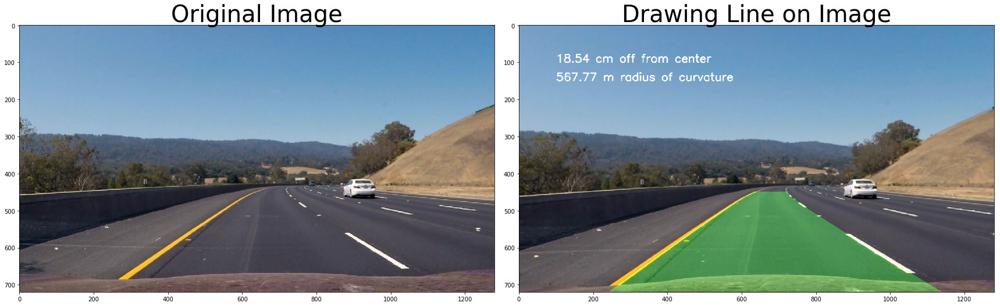

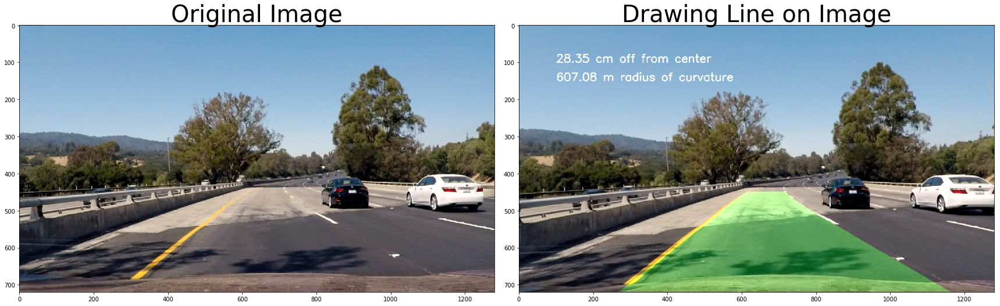

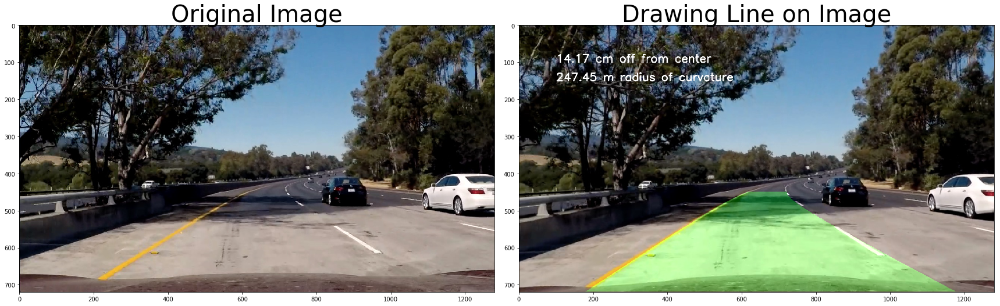

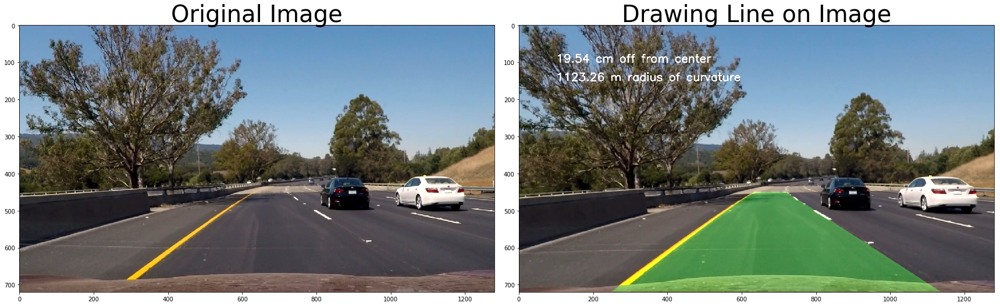

In [18]:
test_images = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(test_images):
    left = Line()
    right = Line()
    
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    img = process_image(test_img)
    
    write_name = 'output_images/stage2/' + fname.split('/')[-1]
    save_img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    cv2.imwrite(write_name, save_img)

    # Plot the result
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(img)
    ax2.set_title('Drawing Line on Image', fontsize=40)

## Test on Videos

Drawing lanes over video! We can test our solution on 3 provided videos:

`project_video.mp4`

`challenge_video.mp4`

`harder_challenge_video`


In [19]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [20]:
left = Line()
right = Line()

project_video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
# clip1 = VideoFileClip("short1.mp4")

project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


 27%|██▋       | 343/1261 [06:49<18:18,  1.20s/it]

line is not valid! reset line


 31%|███▏      | 396/1261 [07:53<17:17,  1.20s/it]

line is not valid! reset line


 33%|███▎      | 420/1261 [08:22<16:58,  1.21s/it]

line is not valid! reset line


 34%|███▍      | 431/1261 [08:35<16:40,  1.21s/it]

line is not valid! reset line


 37%|███▋      | 464/1261 [09:14<15:38,  1.18s/it]

line is not valid! reset line


 37%|███▋      | 469/1261 [09:20<15:34,  1.18s/it]

line is not valid! reset line


 38%|███▊      | 483/1261 [09:36<15:21,  1.18s/it]

line is not valid! reset line


 40%|███▉      | 500/1261 [09:56<15:00,  1.18s/it]

line is not valid! reset line


 41%|████      | 512/1261 [10:11<14:36,  1.17s/it]

line is not valid! reset line


 41%|████      | 515/1261 [10:14<14:31,  1.17s/it]

line is not valid! reset line


 42%|████▏     | 530/1261 [10:32<14:38,  1.20s/it]

line is not valid! reset line


 44%|████▍     | 556/1261 [11:03<14:50,  1.26s/it]

line is not valid! reset line


 44%|████▍     | 559/1261 [11:07<14:44,  1.26s/it]

line is not valid! reset line


 44%|████▍     | 560/1261 [11:08<14:43,  1.26s/it]

line is not valid! reset line


 45%|████▍     | 566/1261 [11:15<13:35,  1.17s/it]

line is not valid! reset line


 46%|████▌     | 576/1261 [11:27<13:18,  1.17s/it]

line is not valid! reset line


 46%|████▋     | 586/1261 [11:39<13:30,  1.20s/it]

line is not valid! reset line


 47%|████▋     | 598/1261 [11:53<13:11,  1.19s/it]

line is not valid! reset line


 77%|███████▋  | 971/1261 [19:09<05:33,  1.15s/it]

line is not valid! reset line


 77%|███████▋  | 975/1261 [19:13<05:28,  1.15s/it]

line is not valid! reset line


 78%|███████▊  | 988/1261 [19:28<05:11,  1.14s/it]

line is not valid! reset line


 99%|█████████▉| 1254/1261 [24:41<00:08,  1.16s/it]

line is not valid! reset line


100%|█████████▉| 1260/1261 [24:48<00:01,  1.20s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 24min 36s, sys: 56.3 s, total: 25min 32s
Wall time: 24min 49s


In [21]:
left = Line()
right = Line()

project_video_output = 'project_video_output_chanllenge.mp4'
clip1 = VideoFileClip("challenge_video.mp4")

project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output_chanllenge.mp4
[MoviePy] Writing video project_video_output_chanllenge.mp4


  1%|          | 4/485 [00:04<09:20,  1.17s/it]

line is not valid! reset line


  4%|▍         | 20/485 [00:23<09:11,  1.19s/it]

line is not valid! reset line


 31%|███▏      | 152/485 [03:00<06:24,  1.15s/it]

line is not valid! reset line


 32%|███▏      | 153/485 [03:02<06:23,  1.16s/it]

line is not valid! reset line


 50%|████▉     | 242/485 [04:48<04:49,  1.19s/it]

line is not valid! reset line


 54%|█████▍    | 262/485 [05:12<04:29,  1.21s/it]

line is not valid! reset line


 56%|█████▌    | 271/485 [05:23<04:06,  1.15s/it]

line is not valid! reset line


 56%|█████▌    | 272/485 [05:24<04:06,  1.16s/it]

line is not valid! reset line


 57%|█████▋    | 277/485 [05:30<03:59,  1.15s/it]

line is not valid! reset line


 57%|█████▋    | 278/485 [05:31<03:58,  1.15s/it]

line is not valid! reset line


 58%|█████▊    | 283/485 [05:37<03:53,  1.16s/it]

line is not valid! reset line


 63%|██████▎   | 305/485 [06:02<03:28,  1.16s/it]

line is not valid! reset line


 63%|██████▎   | 306/485 [06:04<03:26,  1.16s/it]

line is not valid! reset line


 85%|████████▍ | 411/485 [08:08<01:32,  1.25s/it]

line is not valid! reset line
line is not valid! reset line


 88%|████████▊ | 429/485 [08:30<01:06,  1.20s/it]

line is not valid! reset line


 89%|████████▉ | 431/485 [08:32<01:05,  1.21s/it]

line is not valid! reset line


 90%|█████████ | 438/485 [08:40<00:55,  1.18s/it]

line is not valid! reset line


 91%|█████████▏| 443/485 [08:46<00:50,  1.20s/it]

line is not valid! reset line


 92%|█████████▏| 445/485 [08:49<00:49,  1.23s/it]

line is not valid! reset line


 93%|█████████▎| 450/485 [08:55<00:42,  1.21s/it]

line is not valid! reset line


 95%|█████████▌| 462/485 [09:09<00:27,  1.19s/it]

line is not valid! reset line


 96%|█████████▌| 465/485 [09:13<00:24,  1.21s/it]

line is not valid! reset line


 96%|█████████▋| 467/485 [09:16<00:21,  1.21s/it]

line is not valid! reset line


 97%|█████████▋| 471/485 [09:20<00:16,  1.21s/it]

line is not valid! reset line


 97%|█████████▋| 472/485 [09:22<00:15,  1.20s/it]

line is not valid! reset line


 98%|█████████▊| 476/485 [09:27<00:11,  1.26s/it]

line is not valid! reset line


100%|██████████| 485/485 [09:38<00:00,  1.21s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_chanllenge.mp4 

CPU times: user 9min 32s, sys: 21.4 s, total: 9min 53s
Wall time: 9min 38s


In [22]:
left = Line()
right = Line()

project_video_output = 'project_video_output_harder_challenge.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")

project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output_harder_challenge.mp4
[MoviePy] Writing video project_video_output_harder_challenge.mp4


  4%|▎         | 44/1200 [00:52<22:44,  1.18s/it]

line is not valid! reset line


  4%|▍         | 45/1200 [00:53<23:03,  1.20s/it]

line is not valid! reset line


  5%|▌         | 65/1200 [01:18<23:00,  1.22s/it]

line is not valid! reset line


  6%|▌         | 72/1200 [01:26<22:57,  1.22s/it]

line is not valid! reset line


  6%|▋         | 75/1200 [01:30<22:27,  1.20s/it]

line is not valid! reset line


  6%|▋         | 76/1200 [01:31<22:31,  1.20s/it]

line is not valid! reset line


  8%|▊         | 99/1200 [01:59<22:13,  1.21s/it]

line is not valid! reset line


  8%|▊         | 100/1200 [02:00<22:17,  1.22s/it]

line is not valid! reset line


  9%|▉         | 112/1200 [02:15<22:14,  1.23s/it]

line is not valid! reset line


  9%|▉         | 113/1200 [02:16<22:11,  1.22s/it]

line is not valid! reset line


 10%|▉         | 117/1200 [02:21<21:15,  1.18s/it]

line is not valid! reset line


 10%|▉         | 118/1200 [02:22<21:16,  1.18s/it]

line is not valid! reset line


 10%|█         | 123/1200 [02:28<20:52,  1.16s/it]

line is not valid! reset line


 10%|█         | 124/1200 [02:29<20:54,  1.17s/it]

line is not valid! reset line


 11%|█         | 130/1200 [02:36<20:40,  1.16s/it]

line is not valid! reset line


 11%|█         | 131/1200 [02:37<20:34,  1.16s/it]

line is not valid! reset line


 12%|█▏        | 145/1200 [02:53<20:31,  1.17s/it]

line is not valid! reset line


 13%|█▎        | 157/1200 [03:08<20:38,  1.19s/it]

line is not valid! reset line


 21%|██        | 254/1200 [05:07<18:27,  1.17s/it]

line is not valid! reset line
line is not valid! reset line


 22%|██▏       | 261/1200 [05:15<18:20,  1.17s/it]

line is not valid! reset line


 22%|██▏       | 262/1200 [05:16<18:17,  1.17s/it]

line is not valid! reset line


 25%|██▍       | 298/1200 [05:59<17:48,  1.18s/it]

line is not valid! reset line


 25%|██▌       | 305/1200 [06:07<18:19,  1.23s/it]

line is not valid! reset line


 27%|██▋       | 327/1200 [06:36<17:21,  1.19s/it]

line is not valid! reset line


 28%|██▊       | 333/1200 [06:43<17:31,  1.21s/it]

line is not valid! reset line


 31%|███       | 371/1200 [07:29<17:38,  1.28s/it]

line is not valid! reset line


 31%|███       | 372/1200 [07:31<18:23,  1.33s/it]

line is not valid! reset line


 32%|███▏      | 379/1200 [07:39<16:55,  1.24s/it]

line is not valid! reset line


 36%|███▌      | 430/1200 [08:44<16:16,  1.27s/it]

line is not valid! reset line


 36%|███▌      | 431/1200 [08:45<16:20,  1.27s/it]

line is not valid! reset line


 40%|████      | 484/1200 [09:50<14:04,  1.18s/it]

line is not valid! reset line


 40%|████      | 485/1200 [09:51<13:58,  1.17s/it]

line is not valid! reset line


 44%|████▎     | 524/1200 [10:40<14:17,  1.27s/it]

line is not valid! reset line


 45%|████▌     | 545/1200 [11:06<14:11,  1.30s/it]

line is not valid! reset line


 47%|████▋     | 560/1200 [11:25<13:37,  1.28s/it]

line is not valid! reset line


 50%|█████     | 605/1200 [12:20<11:52,  1.20s/it]

line is not valid! reset line


 52%|█████▏    | 620/1200 [12:38<11:38,  1.20s/it]

line is not valid! reset line


 52%|█████▏    | 621/1200 [12:39<11:33,  1.20s/it]

line is not valid! reset line


 54%|█████▍    | 651/1200 [13:16<10:50,  1.19s/it]

line is not valid! reset line


 54%|█████▍    | 653/1200 [13:18<10:52,  1.19s/it]

line is not valid! reset line


 55%|█████▌    | 662/1200 [13:29<10:40,  1.19s/it]

line is not valid! reset line


 55%|█████▌    | 663/1200 [13:30<10:42,  1.20s/it]

line is not valid! reset line


 56%|█████▌    | 667/1200 [13:35<10:40,  1.20s/it]

line is not valid! reset line


 57%|█████▋    | 680/1200 [13:51<10:16,  1.19s/it]

line is not valid! reset line


 57%|█████▋    | 684/1200 [13:55<10:14,  1.19s/it]

line is not valid! reset line


 59%|█████▉    | 710/1200 [14:26<09:44,  1.19s/it]

line is not valid! reset line


 66%|██████▌   | 786/1200 [15:56<08:14,  1.19s/it]

line is not valid! reset line


 66%|██████▌   | 787/1200 [15:57<08:10,  1.19s/it]

line is not valid! reset line


 66%|██████▌   | 790/1200 [16:01<08:01,  1.17s/it]

line is not valid! reset line


 67%|██████▋   | 805/1200 [16:18<07:40,  1.17s/it]

line is not valid! reset line


 67%|██████▋   | 809/1200 [16:23<07:35,  1.17s/it]

line is not valid! reset line


 68%|██████▊   | 815/1200 [16:30<07:28,  1.17s/it]

line is not valid! reset line


 68%|██████▊   | 819/1200 [16:35<07:22,  1.16s/it]

line is not valid! reset line


 69%|██████▊   | 823/1200 [16:39<07:19,  1.16s/it]

line is not valid! reset line


 69%|██████▊   | 824/1200 [16:40<07:18,  1.17s/it]

line is not valid! reset line


 73%|███████▎  | 881/1200 [17:49<06:33,  1.23s/it]

line is not valid! reset line
line is not valid! reset line


 75%|███████▍  | 899/1200 [18:10<05:49,  1.16s/it]

line is not valid! reset line


 75%|███████▌  | 905/1200 [18:17<05:45,  1.17s/it]

line is not valid! reset line


 76%|███████▌  | 911/1200 [18:24<05:36,  1.16s/it]

line is not valid! reset line


 77%|███████▋  | 921/1200 [18:36<05:38,  1.21s/it]

line is not valid! reset line


 81%|████████  | 969/1200 [19:32<04:35,  1.19s/it]

line is not valid! reset line


 81%|████████  | 970/1200 [19:33<04:35,  1.20s/it]

line is not valid! reset line


 81%|████████▏ | 977/1200 [19:41<04:25,  1.19s/it]

line is not valid! reset line


 84%|████████▍ | 1007/1200 [20:17<03:44,  1.17s/it]

line is not valid! reset line
line is not valid! reset line


 84%|████████▍ | 1012/1200 [20:23<03:41,  1.18s/it]

line is not valid! reset line


 84%|████████▍ | 1013/1200 [20:24<03:41,  1.18s/it]

line is not valid! reset line


 86%|████████▌ | 1030/1200 [20:44<03:21,  1.18s/it]

line is not valid! reset line


 86%|████████▌ | 1031/1200 [20:46<03:19,  1.18s/it]

line is not valid! reset line


 92%|█████████▏| 1101/1200 [22:08<02:01,  1.22s/it]

line is not valid! reset line


 92%|█████████▏| 1102/1200 [22:10<01:59,  1.21s/it]

line is not valid! reset line


 92%|█████████▏| 1107/1200 [22:16<01:58,  1.28s/it]

line is not valid! reset line


 92%|█████████▏| 1108/1200 [22:17<01:58,  1.29s/it]

line is not valid! reset line


 93%|█████████▎| 1112/1200 [22:22<01:49,  1.24s/it]

line is not valid! reset line


 93%|█████████▎| 1113/1200 [22:24<01:49,  1.26s/it]

line is not valid! reset line


 94%|█████████▍| 1128/1200 [22:41<01:26,  1.21s/it]

line is not valid! reset line


 94%|█████████▍| 1129/1200 [22:43<01:24,  1.19s/it]

line is not valid! reset line


 96%|█████████▌| 1148/1200 [23:05<01:03,  1.21s/it]

line is not valid! reset line


 96%|█████████▋| 1158/1200 [23:17<00:49,  1.18s/it]

line is not valid! reset line
line is not valid! reset line


100%|█████████▉| 1199/1200 [24:06<00:01,  1.25s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_harder_challenge.mp4 

CPU times: user 23min 46s, sys: 59 s, total: 24min 45s
Wall time: 24min 7s
